# Song Generation: Neural Style Transfer for audio

With the use of convolutional neural networks (CNNs), we saw a vast rise in works involving style transfer to create a new image involving the content from one image and the style from a different image. In this project, we will be investigating applications and usage of CNNs in generating audios from random noise containing the content (i.e. tempo, melody) of one audio clip and the style of another audio (i.e. instrument types, pitch). The solution to this problem can potentially allow generation of new audio through the mixture of two completely different types of audio content.

### Import libraries

In [11]:
import sys
import numpy as np
import tensorflow as tf
import librosa
import os
from IPython.display import Audio, display
import matplotlib.pyplot as plt
%matplotlib inline

### Load style and content

In [12]:
def load_audio(path):
    display(Audio(path))

In [13]:
def write_audio(result , example,OUTPUT_FILENAME):
    a = np.zeros_like(example)
    a[:N_CHANNELS,:] = np.exp(result[0,0].T) - 1

    # This code is supposed to do phase reconstruction
    p = 2 * np.pi * np.random.random_sample(a.shape) - np.pi
    for i in range(500):
        S = a * np.exp(1j*p)
        x = librosa.istft(S)

    librosa.output.write_wav(OUTPUT_FILENAME, x, fs)

In [14]:
CONTENT_FILENAME = "inputs/bensound-ukulele.mp3"
STYLE_FILENAME = "inputs/fire.mp3"

print "Content File::"
load_audio(CONTENT_FILENAME)

print "Style File::"
load_audio(STYLE_FILENAME)

Content File::


Style File::


### Convert Audio to Spectogram

In [15]:
# Reads wav file and produces spectrum
def convert_audio_to_spectogram(filename):
    FFT_WINDOW_SIZE = 2048
    CLIP_SIZE = 430
    x, fs = librosa.load(filename)
    S = librosa.stft(x, FFT_WINDOW_SIZE)
    S = np.log1p(np.abs(S[:,:CLIP_SIZE]))  
    return S,fs

In [16]:
# Change Style shape to match Content Shape
def match_shapes(a_content, a_style):
    CONTENT_SAMPLES = a_content.shape[1]
    CONTENT_CHANNELS = a_content.shape[0]
    STYLE_SAMPLES = a_style.shape[1]
    STYLE_CHANNELS = a_style.shape[0]

    if CONTENT_SAMPLES >= STYLE_SAMPLES :
        a_style = a_style[:CONTENT_CHANNELS, :CONTENT_SAMPLES]
    else:
        a_content = a_content[:STYLE_CHANNELS, :STYLE_SAMPLES]

In [17]:
a_content,fs = convert_audio_to_spectogram(CONTENT_FILENAME)
a_style, fs = convert_audio_to_spectogram(STYLE_FILENAME)

print "before resizing::", a_style.shape , a_content.shape
match_shapes(a_content, a_style)
N_SAMPLES = a_content.shape[1]
N_CHANNELS = a_content.shape[0]
print "after resizing::", a_style.shape , a_content.shape

before resizing:: (1025, 430) (1025, 430)
after resizing:: (1025, 430) (1025, 430)


### Visualize spectrograms for content and style tracks

In [18]:
def plot_spectogram(images_list):
    Y_AXIS_TRIM = 400
    IMG_WIDTH = 20
    IMG_HEIGHT = 20

    plt.figure(figsize=(IMG_WIDTH, IMG_HEIGHT))

    for i in range(len(images_list)):
        plt.subplot(1, len(images_list), i+1)
        plt.title(images_list[i]["name"])
        plt.imshow(images_list[i]["data"][:Y_AXIS_TRIM,:])
    plt.show()

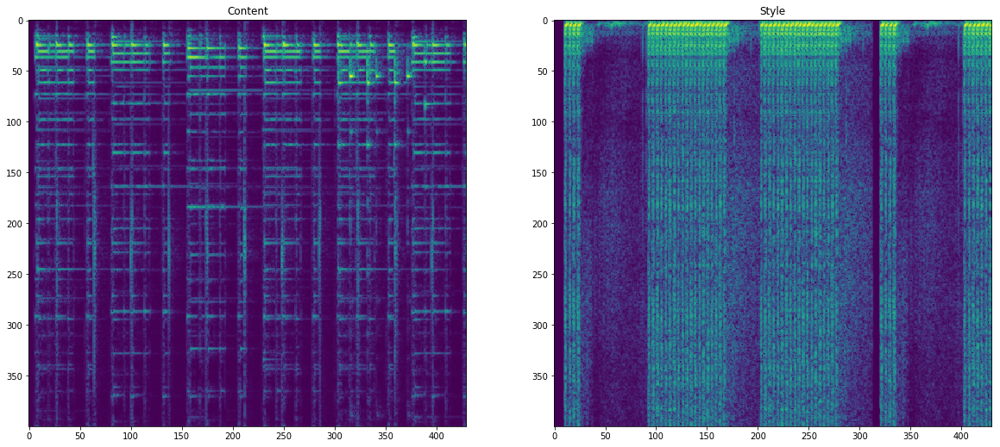

In [19]:
plot_spectogram([
    {
        "name":"Content",
         "data": a_content
    },
    {
        "name":"Style",
        "data": a_style
    }])

### Compute content and style feats

In [20]:
N_FILTERS = 4096
a_content_tf = np.ascontiguousarray(a_content.T[None,None,:,:])
a_style_tf = np.ascontiguousarray(a_style.T[None,None,:,:])

# filter shape is "[filter_height, filter_width, in_channels, out_channels]"
std = np.sqrt(2) * np.sqrt(2.0 / ((N_CHANNELS + N_FILTERS) * 11))

filter = np.random.randn(1, 11, N_CHANNELS, N_FILTERS)*std


g = tf.Graph()
with g.as_default(), g.device('/cpu:0'), tf.Session() as sess:
    # data shape is "[batch, in_height, in_width, in_channels]",
    x = tf.placeholder('float32', [1,1,N_SAMPLES,N_CHANNELS], name="x")

    filter_tf = tf.constant(filter, name="filter", dtype='float32')
    conv = tf.nn.conv2d(
        x,
        filter_tf,
        strides=[1, 1, 1, 1],
        padding="VALID",
        name="conv")

    net = tf.nn.relu(conv)

    content_features = net.eval(feed_dict={x: a_content_tf})
    style_features = net.eval(feed_dict={x: a_style_tf})

    features = np.reshape(style_features, (-1, N_FILTERS))
    style_gram = np.matmul(features.T, features) / N_SAMPLES

### Optimize

Started optimization.
INFO:tensorflow:Optimization terminated with:
  Message: STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
  Objective function value: 8515.546875
  Number of iterations: 100
  Number of functions evaluations: 115
i: 0 Interim loss: 8515.547
(1, 1, 430, 1025)
(430, 1025)


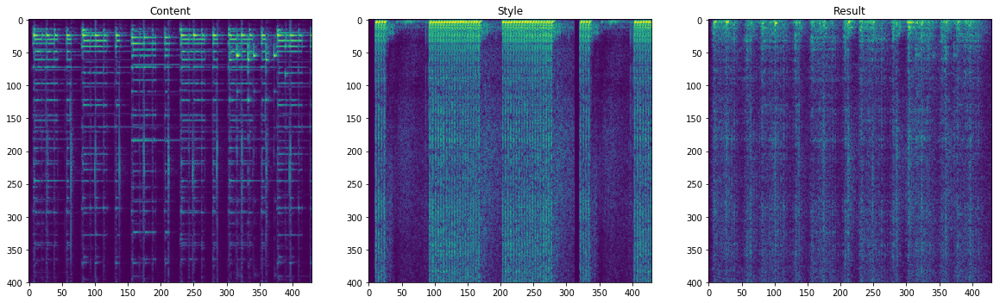

INFO:tensorflow:Optimization terminated with:
  Message: STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
  Objective function value: 8152.169434
  Number of iterations: 100
  Number of functions evaluations: 106
i: 1 Interim loss: 8152.1694
(1, 1, 430, 1025)
(430, 1025)


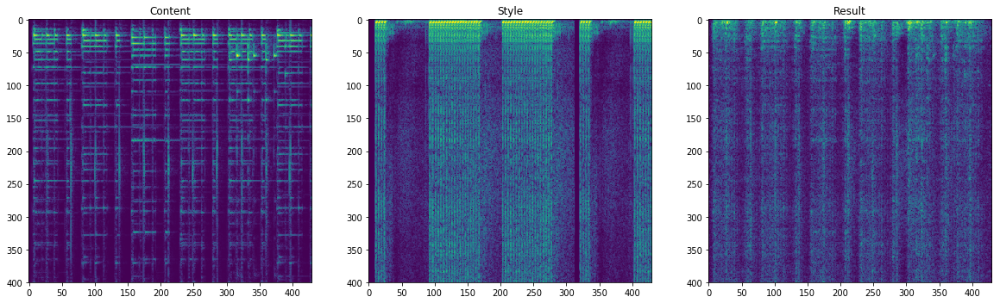

INFO:tensorflow:Optimization terminated with:
  Message: STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
  Objective function value: 8080.801270
  Number of iterations: 100
  Number of functions evaluations: 106
i: 2 Interim loss: 8080.8013
(1, 1, 430, 1025)
(430, 1025)


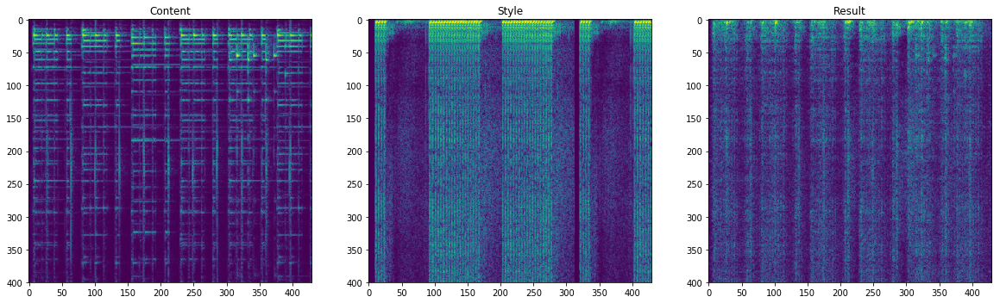

Final loss: 8080.8013
Final result: [[[[-0.02649303 -0.5926436  -0.2541176  ...  0.08225095  0.94094676
     0.3437678 ]
   [-1.2769816  -0.18111758 -0.6424606  ... -0.66418225 -0.5254926
     1.3668445 ]
   [ 0.7362236  -0.67947346  0.5057029  ...  0.9119189  -1.0426749
     0.05931871]
   ...
   [ 0.40766203  0.5948278   1.5522228  ...  0.18063939 -0.63591635
    -0.27304816]
   [ 0.80737376  0.5188817   0.7673499  ...  1.056099   -0.28233844
     0.03480658]
   [ 0.07458873  0.16022483  0.96451366 ...  0.25127384  0.04619862
     0.43411478]]]]


In [21]:
from sys import stderr

ALPHA= 1e-2
learning_rate= 1e-3
iterations = 100


def step_handler_callback(interim_result, step):
    OUTPUT_FILENAME = 'outputs/out'+str(step)+'.wav'
    print interim_result.shape
    print interim_result[0,0].shape
    write_audio(interim_result , a_content,OUTPUT_FILENAME)
    a_result, fs2 = convert_audio_to_spectogram(OUTPUT_FILENAME)
    
    load_audio(OUTPUT_FILENAME)
    plot_spectogram([
    {
        "name":"Content",
         "data": a_content
    },
    {
        "name":"Style",
        "data": a_style
    },
    {
        "name":"Result",
        "data": a_result
    }])
    

result = None
interim_result = None
with tf.Graph().as_default():

    # Build graph with variable input
    x = tf.Variable(np.random.randn(1,1,N_SAMPLES,N_CHANNELS).astype(np.float32)*1e-3, name="x")

    filter_tf = tf.constant(filter, name="filter", dtype='float32')
    conv = tf.nn.conv2d(
        x,
        filter_tf,
        strides=[1, 1, 1, 1],
        padding="VALID",
        name="conv")
    
    
    net = tf.nn.relu(conv)

    content_loss = ALPHA * 2 * tf.nn.l2_loss(
            net - content_features)

    style_loss = 0

    _, height, width, number = map(lambda i: i.value, net.get_shape())

    size = height * width * number
    feats = tf.reshape(net, (-1, number))
    gram = tf.matmul(tf.transpose(feats), feats)  / N_SAMPLES
    #style_loss = BETA * 2 * tf.nn.l2_loss(gram - style_gram)
    style_loss = 2 * tf.nn.l2_loss(gram - style_gram)

     # Overall loss
    loss = content_loss + style_loss

    opt = tf.contrib.opt.ScipyOptimizerInterface(
          loss, method='L-BFGS-B', options={'maxiter': 100})
        
    # Optimization
    with tf.Session() as sess:
        
        sess.run(tf.global_variables_initializer())
       
        print('Started optimization.')
        #opt.minimize(sess)
        
        EPOCH_COUNT = 3
        for i in range(EPOCH_COUNT):
            opt.minimize(sess)
            print 'i:' , i , 'Interim loss:', loss.eval()
            interim_result = x.eval()
            step_handler_callback(interim_result, i)
                
    
        print 'Final loss:', loss.eval()
        result = x.eval()
        print 'Final result:', result


### Invert spectrogram and save the result

In [22]:
OUTPUT_FILENAME = 'outputs/out-final.wav'
write_audio(result , a_content,OUTPUT_FILENAME)

In [23]:
a_result, fs = convert_audio_to_spectogram(OUTPUT_FILENAME)
display(Audio(OUTPUT_FILENAME))

### Visualize input and output spectrograms

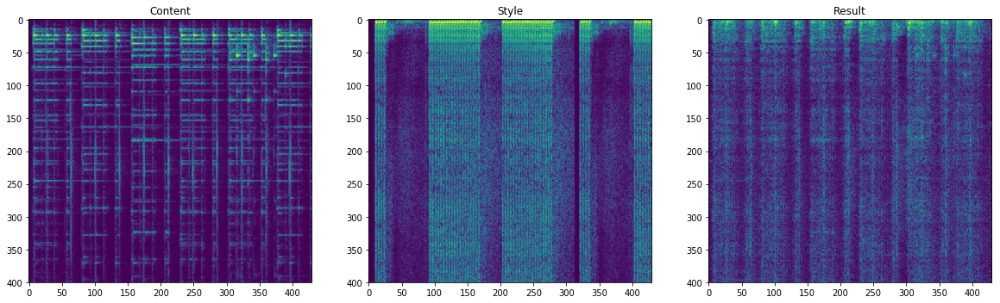

In [24]:
plot_spectogram([
    {
        "name":"Content",
         "data": a_content
    },
    {
        "name":"Style",
        "data": a_style
    },
    {
        "name":"Result",
        "data": a_result
    }])